In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth
/kaggle/input/few-shot-industrial-defect-detection/data.json
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_166.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_157.png
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_064.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_101.png
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_057.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_047.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_035.png
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_202.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/test_good_016.png
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_225.bmp
/kaggle/input/few-shot-industrial-defect-detection/wood/good/train_good_024.bmp
/ka

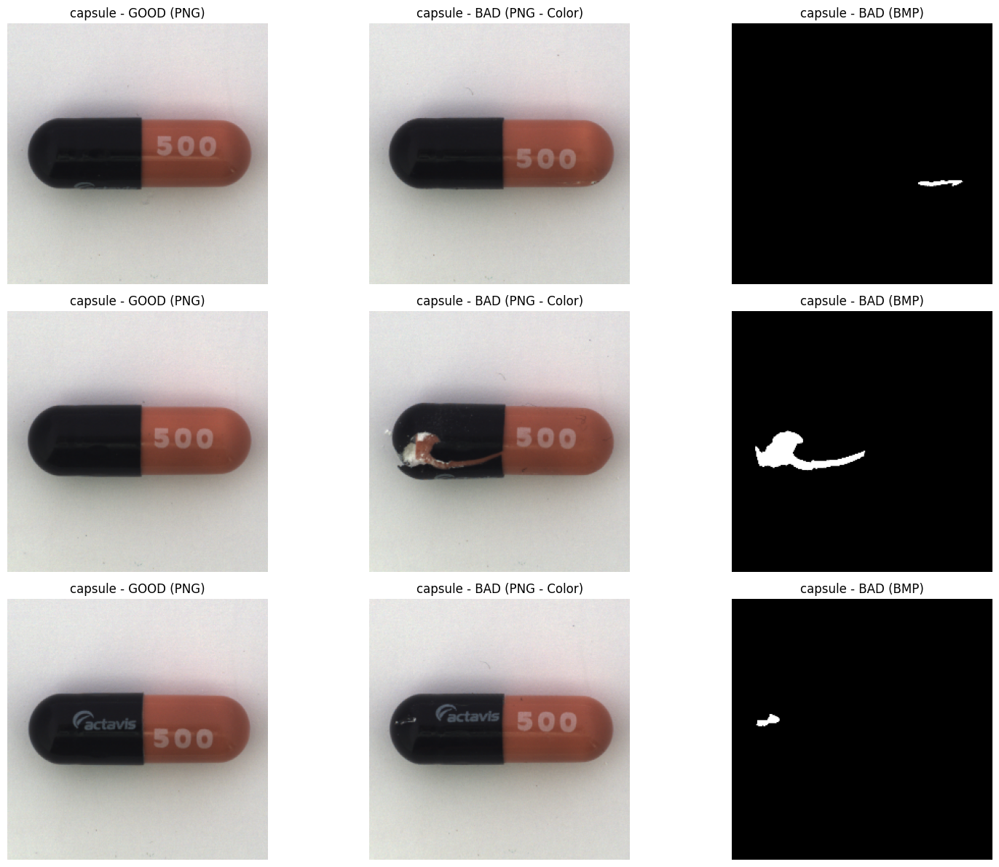

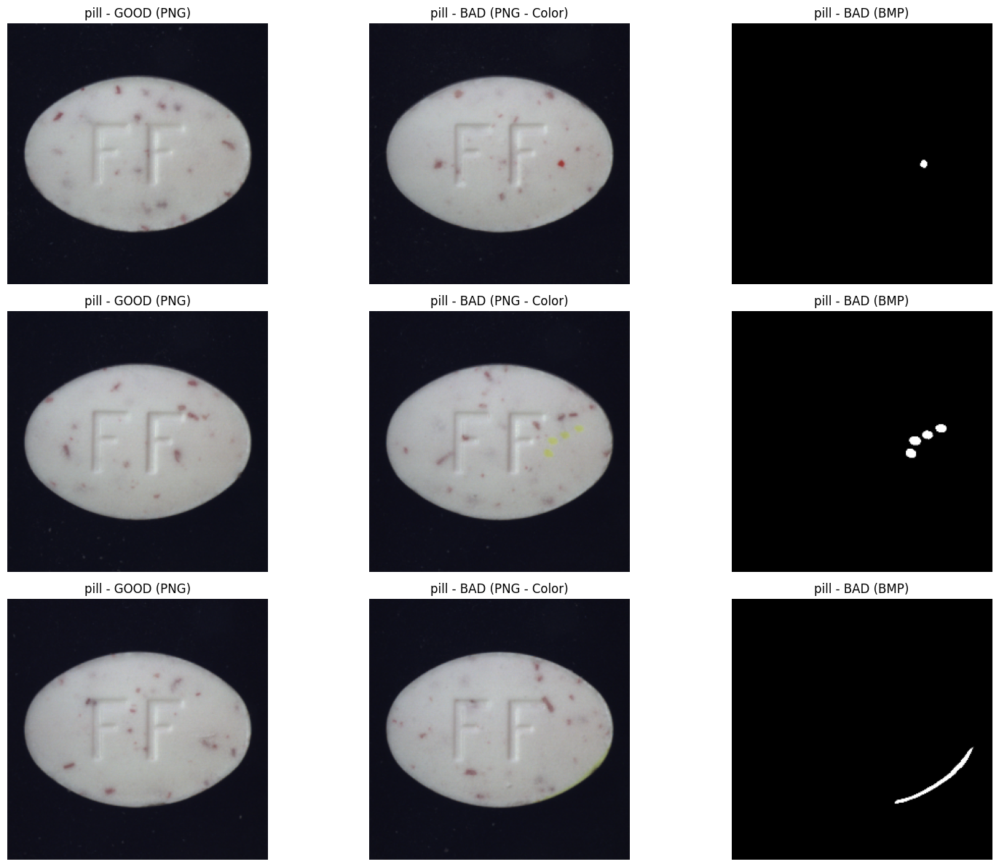

In [2]:
import os
import cv2
import matplotlib.pyplot as plt

def show_image_mask_pairs(root_dir, category="capsule", num_samples=3):
    fig, axs = plt.subplots(num_samples, 3, figsize=(16, 4 * num_samples))  # 4 columns now

    bad_dir = os.path.join(root_dir, category, "bad")
    good_dir = os.path.join(root_dir, category, "good")
    
    bad_imgs = sorted([f for f in os.listdir(bad_dir) if f.endswith(".png")])[:num_samples]
    good_imgs = sorted([f for f in os.listdir(good_dir) if f.endswith(".png")])[:num_samples]

    for i in range(num_samples):
        # Good PNG image
        good_img_path = os.path.join(good_dir, good_imgs[i])
        good_img = cv2.imread(good_img_path)
        good_img = cv2.cvtColor(good_img, cv2.COLOR_BGR2RGB)

        # Bad PNG (mask) and corresponding BMP
        bad_mask_path = os.path.join(bad_dir, bad_imgs[i])
        bad_img_path = bad_mask_path.replace(".png", ".bmp")

        bad_mask = cv2.imread(bad_mask_path, cv2.IMREAD_GRAYSCALE)
        bad_img = cv2.imread(bad_img_path)
        bad_img = cv2.cvtColor(bad_img, cv2.COLOR_BGR2RGB)

        # Colorful PNG of the bad image
        bad_png_color = cv2.imread(bad_mask_path)  # Read in color
        bad_png_color = cv2.cvtColor(bad_png_color, cv2.COLOR_BGR2RGB)

        axs[i, 0].imshow(good_img)
        axs[i, 0].set_title(f"{category} - GOOD (PNG)")
        axs[i, 0].axis("off")

        axs[i, 1].imshow(bad_png_color)
        axs[i, 1].set_title(f"{category} - BAD (PNG - Color)")
        axs[i, 1].axis("off")

        axs[i, 2].imshow(bad_img)
        axs[i, 2].set_title(f"{category} - BAD (BMP)")
        axs[i, 2].axis("off")

    plt.tight_layout()
    plt.show()

# Example usage
show_image_mask_pairs("/kaggle/input/few-shot-industrial-defect-detection", "capsule", num_samples=3)
show_image_mask_pairs("/kaggle/input/few-shot-industrial-defect-detection", "pill", num_samples=3)


In [3]:
#SAM
!pip install git+https://github.com/facebookresearch/segment-anything.git
#Transformers
!pip install -q git+https://github.com/huggingface/transformers.git
#Datasets to prepare data and monai if you want to use special loss functions
!pip install datasets
!pip install -q monai

  Cloning https://github.com/facebookresearch/segment-anything.git to /tmp/pip-req-build-46nknp3i
  Running command git clone --filter=blob:none --quiet https://github.com/facebookresearch/segment-anything.git /tmp/pip-req-build-46nknp3i
  Resolved https://github.com/facebookresearch/segment-anything.git to commit dca509fe793f601edb92606367a655c15ac00fdf
  Preparing metadata (setup.py) ... done
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 558.8/558.8 kB 9.7 MB/s eta 0:00:00ta 0:00:01
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
datasets 3.6.0 requires fsspec[http]<=2025.3.0,>=2023.1.0, but you have fsspec 2025.5.1 which is incompatible.
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 193.6/193.6 kB 4.4 MB/s eta 0:00:00a 0:00:01
  

Get bounding box similar to prompts in the segment anything model

In [4]:
!pip install albumentations --quiet


In [5]:
# def get_bounding_box(mask, pad=20):
#     """
#     Compute bounding box (x_min, y_min, x_max, y_max) from binary mask.
#     Optionally adds random perturbation (up to `pad` pixels).
#     """
#     y_indices, x_indices = np.where(mask > 0)
#     if len(x_indices) == 0 or len(y_indices) == 0:
#         return None  # handle empty masks gracefully

#     x_min, x_max = np.min(x_indices), np.max(x_indices)
#     y_min, y_max = np.min(y_indices), np.max(y_indices)

#     # Add random perturbation
#     H, W = mask.shape
#     x_min = max(0, x_min - np.random.randint(0, pad))
#     x_max = min(W, x_max + np.random.randint(0, pad))
#     y_min = max(0, y_min - np.random.randint(0, pad))
#     y_max = min(H, y_max + np.random.randint(0, pad))

#     return [x_min, y_min, x_max, y_max]

def get_bounding_box(mask, pad=10):
    y_indices, x_indices = np.where(mask > 0)
    if len(x_indices) == 0 or len(y_indices) == 0:
        return [0,0,1,1]
    x_min, x_max = np.min(x_indices), np.max(x_indices)
    y_min, y_max = np.min(y_indices), np.max(y_indices)
    H, W = mask.shape
    x_min = max(0, x_min - pad)
    x_max = min(W, x_max + pad)
    y_min = max(0, y_min - pad)
    y_max = min(H, y_max + pad)
    return [x_min, y_min, x_max, y_max]



In [6]:
# def get_positive_point(mask):
#     ys, xs = np.where(mask > 0)
#     if len(xs) == 0:
#         return None
#     idx = np.random.choice(len(xs))
#     return [xs[idx], ys[idx]]  # x, y coordinates

def compute_dice(pred_mask, true_mask):
    pred_flat = pred_mask.flatten()
    true_flat = true_mask.flatten()
    intersection = (pred_flat * true_flat).sum()
    return (2. * intersection) / (pred_flat.sum() + true_flat.sum() + 1e-7)

In [7]:
from torch.utils.data import Dataset
import cv2
import torch
from segment_anything.utils.transforms import ResizeLongestSide

# class SAMDefectDataset(Dataset):
#     def __init__(self, samples, transform=None, image_size=1024):
#         """
#         samples: list of (image_path, mask_path)
#         transform: optional callable for image/mask (e.g., augmentations)
#         image_size: target input size for SAM
#         """
#         self.samples = samples
#         self.transform = transform
#         self.resize = ResizeLongestSide(image_size)

#     def __len__(self):
#         return len(self.samples)

#     def __getitem__(self, idx):
#         img_path, mask_path = self.samples[idx]

#         # Load image and mask
#         image = cv2.imread(img_path)
#         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
#         mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)

#         # Resize image (SAM style)
#         resized_image = self.resize.apply_image(image)
#         image_tensor = torch.as_tensor(resized_image).permute(2, 0, 1).float() / 255.0

#         # Resize mask
#         resized_mask = self.resize.apply_image(mask)
#         resized_mask = (resized_mask > 127).astype(np.uint8)
#         mask_tensor = torch.as_tensor(resized_mask).unsqueeze(0).float()

#         # Get bounding box from original (not resized) mask
#         # Compute bounding box on resized mask instead
#         resized_mask_binary = (resized_mask > 127).astype(np.uint8)
#         prompt_box = get_bounding_box(resized_mask_binary)
#         if prompt_box is None:
#             prompt_box = [0, 0, 1, 1]  # dummy box if empty
#         prompt_box = torch.tensor(prompt_box, dtype=torch.float32).unsqueeze(0)  # (1, 4)


#         return {
#             "image": image_tensor,
#             "mask": mask_tensor,
#             "box": prompt_box
#         }

import albumentations as A
from albumentations.pytorch import ToTensorV2

train_transform = A.Compose([
    A.HorizontalFlip(p=0.5),
    A.VerticalFlip(p=0.5),
    A.RandomRotate90(p=0.5),
    A.ShiftScaleRotate(shift_limit=0.1, scale_limit=0.1, rotate_limit=15, p=0.5),
    A.RandomBrightnessContrast(p=0.5),
])

class SAMDefectDataset(Dataset):
    def __init__(self, samples, image_size=1024, transform=None):
        self.samples = samples
        self.resize = ResizeLongestSide(image_size)
        self.transform = transform
        self.normalize = A.Normalize(mean=(0.485, 0.456, 0.406),
                                     std=(0.229, 0.224, 0.225))

    def __len__(self):
        return len(self.samples)

    def __getitem__(self, idx):
        img_path, mask_path = self.samples[idx]

        image = cv2.imread(img_path)
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        mask_binary = (mask > 127).astype(np.uint8)

        if self.transform:
            augmented = self.transform(image=image, mask=mask_binary)
            image = augmented["image"]
            mask_binary = augmented["mask"]

        resized_image = self.resize.apply_image(image)
        resized_mask = self.resize.apply_image(mask_binary)
        resized_mask_binary = (resized_mask > 0).astype(np.uint8)

        image_tensor = torch.as_tensor(resized_image).permute(2, 0, 1).float() / 255.0
        mask_tensor = torch.as_tensor(resized_mask_binary).unsqueeze(0).float()

        box = get_bounding_box(resized_mask_binary)
        box_tensor = torch.tensor(box, dtype=torch.float32)

        return {
            "image": image_tensor,
            "mask": mask_tensor,
            "box": box_tensor,
        }

/usr/local/lib/python3.11/dist-packages/albumentations/core/validation.py:114: UserWarning: ShiftScaleRotate is a special case of Affine transform. Please use Affine transform instead.
  original_init(self, **validated_kwargs)


Prepare image, masks pair list from the bad directory

In [8]:
import os

def get_samples(root_dir, categories=["capsule", "pill"]):
    samples = []
    for category in categories:
        bad_dir = os.path.join(root_dir, category, "bad")
        for fname in os.listdir(bad_dir):
            if fname.endswith(".png"):  # Look for PNG files (the images)
                img_path = os.path.join(bad_dir, fname)
                #print(f'image path is {img_path}')
                mask_path = img_path.replace(".png", ".bmp") # Create the corresponding BMP path (the masks)
                #print(f'mask path is {mask_path}')
                if os.path.exists(mask_path):
                    samples.append((img_path, mask_path))
    return samples

root_dir = "/kaggle/input/few-shot-industrial-defect-detection"
samples = get_samples(root_dir)

Split into train and test sets

In [9]:
from sklearn.model_selection import train_test_split

train_samples, test_samples = train_test_split(samples, test_size=0.2, random_state=42)


Create datasets and dataloaders

In [10]:
from torch.utils.data import DataLoader

# train_dataset = SAMDefectDataset(train_samples)
# test_dataset = SAMDefectDataset(test_samples)

# train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
# test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)

train_dataset = SAMDefectDataset(train_samples, transform=train_transform)
test_dataset = SAMDefectDataset(test_samples)

train_loader = DataLoader(train_dataset, batch_size=1, shuffle=True)
test_loader = DataLoader(test_dataset, batch_size=1, shuffle=False)


Load SAM model (Meta's version)

In [11]:
from segment_anything import sam_model_registry

# Update with your SAM checkpoint path
checkpoint_path = "/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth"
sam = sam_model_registry["vit_b"](checkpoint=checkpoint_path)
sam.to("cuda")

# Freeze image and prompt encoder
for p in sam.image_encoder.parameters():
    p.requires_grad = False
for p in sam.prompt_encoder.parameters():
    p.requires_grad = False



In [12]:
from monai.losses import DiceCELoss
from torch.optim import Adam
from torch.optim import AdamW
from torch.optim.lr_scheduler import ReduceLROnPlateau


loss_fn = DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')
optimizer = Adam(sam.mask_decoder.parameters(), lr=1e-4)
scheduler = ReduceLROnPlateau(optimizer, mode='min', factor=0.5, patience=3)


<frozen importlib._bootstrap_external>:1241: FutureWarning: The cuda.cudart module is deprecated and will be removed in a future release, please switch to use the cuda.bindings.runtime module instead.
2025-08-05 10:17:55.303280: E external/local_xla/xla/stream_executor/cuda/cuda_fft.cc:477] Unable to register cuFFT factory: Attempting to register factory for plugin cuFFT when one has already been registered
E0000 00:00:1754389075.645113      36 cuda_dnn.cc:8310] Unable to register cuDNN factory: Attempting to register factory for plugin cuDNN when one has already been registered
E0000 00:00:1754389075.743161      36 cuda_blas.cc:1418] Unable to register cuBLAS factory: Attempting to register factory for plugin cuBLAS when one has already been registered


In [13]:
# import torch.nn.functional as F
# from tqdm import tqdm

# sam.train()

# for epoch in range(10):  # adjust epochs
#     total_loss = 0
#     for batch in tqdm(train_loader):
#         image = batch["image"].to("cuda")           # (B, 3, H, W)
#         mask_gt = batch["mask"].to("cuda")           # (B, 1, H, W)
#         box = batch["box"].to("cuda")                # (B, 1, 4)

#         # Step 1: Image Embedding
#         image_embedding = sam.image_encoder(image)   # (B, C, H', W')

#         # Step 2: Prompt Encoding
#         sparse_embeddings, dense_embeddings = sam.prompt_encoder(
#             points=None,
#             boxes=box,
#             masks=None
#         )

#         image_pe = sam.prompt_encoder.get_dense_pe().to(image.device)

#         # Step 3: Decode masks
#         low_res_masks, _ = sam.mask_decoder(
#             image_embeddings=image_embedding,
#             image_pe=image_pe,
#             sparse_prompt_embeddings=sparse_embeddings,
#             dense_prompt_embeddings=dense_embeddings,
#             multimask_output=False
#         )

#         # Resize prediction to ground truth size
#         pred_mask = F.interpolate(low_res_masks, size=mask_gt.shape[-2:], mode="bilinear")

#         # Step 4: Loss & Optimization
#         loss = loss_fn(pred_mask, mask_gt)
#         total_loss += loss.item()

#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#     avg_loss = total_loss / len(train_loader)
#     print(f"Epoch {epoch+1}: Avg Loss = {avg_loss:.4f}")


# torch.save(sam.mask_decoder.state_dict(), "/kaggle/working/sam_decoder_finetuned_medicine_corrected.pth")


import torch.nn.functional as F
from tqdm import tqdm
import numpy as np

def compute_dice(pred, target, epsilon=1e-6):
    intersection = (pred * target).sum()
    union = pred.sum() + target.sum()
    dice = (2 * intersection + epsilon) / (union + epsilon)
    return dice

num_epochs = 30

for epoch in range(num_epochs):
    sam.train()
    total_loss = 0
    for batch in tqdm(train_loader, desc=f"Training Epoch {epoch+1}/{num_epochs}"):
        image = batch["image"].to("cuda")
        mask_gt = batch["mask"].to("cuda")
        box = batch["box"].to("cuda").unsqueeze(0)  # shape (1, 4)

        optimizer.zero_grad()

        image_embedding = sam.image_encoder(image)
        sparse_embeddings, dense_embeddings = sam.prompt_encoder(
            boxes=box,
            points=None,
            masks=None,
        )
        image_pe = sam.prompt_encoder.get_dense_pe().to(image.device)

        low_res_masks, _ = sam.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=image_pe,
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False
        )

        pred_mask = F.interpolate(low_res_masks, size=mask_gt.shape[-2:], mode="bilinear", align_corners=False)
        loss = loss_fn(pred_mask, mask_gt)

        loss.backward()
        optimizer.step()

        total_loss += loss.item()

    avg_loss = total_loss / len(train_loader)
    print(f"Epoch {epoch+1}: Train Loss = {avg_loss:.4f}")

    # Optional validation
    sam.eval()
    dice_scores = []
    with torch.no_grad():
        for batch in test_loader:
            image = batch["image"].to("cuda")
            mask_gt = batch["mask"].to("cuda")
            box = batch["box"].to("cuda").unsqueeze(0)

            image_embedding = sam.image_encoder(image)
            sparse_embeddings, dense_embeddings = sam.prompt_encoder(
                boxes=box,
                points=None,
                masks=None,
            )
            image_pe = sam.prompt_encoder.get_dense_pe().to(image.device)

            low_res_masks, _ = sam.mask_decoder(
                image_embeddings=image_embedding,
                image_pe=image_pe,
                sparse_prompt_embeddings=sparse_embeddings,
                dense_prompt_embeddings=dense_embeddings,
                multimask_output=False
            )

            pred_mask = F.interpolate(low_res_masks, size=mask_gt.shape[-2:], mode="bilinear", align_corners=False)
            pred_mask_bin = (pred_mask.sigmoid() > 0.5).float()

            dice = compute_dice(pred_mask_bin.cpu().numpy(), mask_gt.cpu().numpy())
            dice_scores.append(dice)

    print(f"Epoch {epoch+1}: Validation Dice = {np.mean(dice_scores):.4f}")

torch.save(sam.mask_decoder.state_dict(), "/kaggle/working/sam_finetuned_box_only.pth")


Training Epoch 1/30: 100%|██████████| 200/200 [01:32<00:00,  2.16it/s]


Epoch 1: Train Loss = 0.3132
Epoch 1: Validation Dice = 0.7426


Training Epoch 2/30: 100%|██████████| 200/200 [01:48<00:00,  1.85it/s]


Epoch 2: Train Loss = 0.2814
Epoch 2: Validation Dice = 0.7294


Training Epoch 3/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 3: Train Loss = 0.2642
Epoch 3: Validation Dice = 0.7683


Training Epoch 4/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 4: Train Loss = 0.2296
Epoch 4: Validation Dice = 0.7728


Training Epoch 5/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 5: Train Loss = 0.2424
Epoch 5: Validation Dice = 0.7598


Training Epoch 6/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 6: Train Loss = 0.2437
Epoch 6: Validation Dice = 0.7838


Training Epoch 7/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 7: Train Loss = 0.2277
Epoch 7: Validation Dice = 0.7751


Training Epoch 8/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 8: Train Loss = 0.2228
Epoch 8: Validation Dice = 0.7860


Training Epoch 9/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 9: Train Loss = 0.2336
Epoch 9: Validation Dice = 0.7836


Training Epoch 10/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 10: Train Loss = 0.2405
Epoch 10: Validation Dice = 0.7855


Training Epoch 11/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 11: Train Loss = 0.2909
Epoch 11: Validation Dice = 0.7777


Training Epoch 12/30: 100%|██████████| 200/200 [01:50<00:00,  1.82it/s]


Epoch 12: Train Loss = 0.2295
Epoch 12: Validation Dice = 0.7586


Training Epoch 13/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 13: Train Loss = 0.2190
Epoch 13: Validation Dice = 0.7347


Training Epoch 14/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 14: Train Loss = 0.2087
Epoch 14: Validation Dice = 0.7923


Training Epoch 15/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 15: Train Loss = 0.2151
Epoch 15: Validation Dice = 0.7678


Training Epoch 16/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 16: Train Loss = 0.2180
Epoch 16: Validation Dice = 0.7861


Training Epoch 17/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 17: Train Loss = 0.2132
Epoch 17: Validation Dice = 0.7827


Training Epoch 18/30: 100%|██████████| 200/200 [01:50<00:00,  1.82it/s]


Epoch 18: Train Loss = 0.2109
Epoch 18: Validation Dice = 0.7833


Training Epoch 19/30: 100%|██████████| 200/200 [01:50<00:00,  1.82it/s]


Epoch 19: Train Loss = 0.2041
Epoch 19: Validation Dice = 0.7993


Training Epoch 20/30: 100%|██████████| 200/200 [01:49<00:00,  1.82it/s]


Epoch 20: Train Loss = 0.2109
Epoch 20: Validation Dice = 0.7674


Training Epoch 21/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 21: Train Loss = 0.2077
Epoch 21: Validation Dice = 0.7981


Training Epoch 22/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 22: Train Loss = 0.2046
Epoch 22: Validation Dice = 0.7970


Training Epoch 23/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 23: Train Loss = 0.2003
Epoch 23: Validation Dice = 0.7953


Training Epoch 24/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 24: Train Loss = 0.1834
Epoch 24: Validation Dice = 0.7970


Training Epoch 25/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 25: Train Loss = 0.1936
Epoch 25: Validation Dice = 0.7847


Training Epoch 26/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 26: Train Loss = 0.1969
Epoch 26: Validation Dice = 0.7878


Training Epoch 27/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 27: Train Loss = 0.1848
Epoch 27: Validation Dice = 0.7706


Training Epoch 28/30: 100%|██████████| 200/200 [01:50<00:00,  1.82it/s]


Epoch 28: Train Loss = 0.2043
Epoch 28: Validation Dice = 0.7983


Training Epoch 29/30: 100%|██████████| 200/200 [01:50<00:00,  1.81it/s]


Epoch 29: Train Loss = 0.2007
Epoch 29: Validation Dice = 0.7947


Training Epoch 30/30: 100%|██████████| 200/200 [01:50<00:00,  1.82it/s]


Epoch 30: Train Loss = 0.2092
Epoch 30: Validation Dice = 0.7841


In [16]:
import torch
import torch.nn.functional as F
from segment_anything import sam_model_registry
from torch.optim import Adam
from tqdm import tqdm
from monai.losses import DiceCELoss

# --- 1. Load SAM model from Meta checkpoint ---
sam_ckpt_path = "/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth"
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt_path)
sam.to("cuda")

# --- 2. Freeze image & prompt encoders ---
for p in sam.image_encoder.parameters():
    p.requires_grad = False
for p in sam.prompt_encoder.parameters():
    p.requires_grad = False

# --- 3. Load fine-tuned decoder weights ---
decoder_ckpt_path = "/kaggle/working/sam_finetuned_box_only.pth"
sam.mask_decoder.load_state_dict(torch.load(decoder_ckpt_path, map_location="cuda"))
print("✅ Loaded fine-tuned decoder weights")

# --- 4. Define optimizer & loss ---
optimizer = Adam(sam.mask_decoder.parameters(), lr=1e-5)
loss_fn = DiceCELoss(sigmoid=True, squared_pred=True, reduction='mean')


✅ Loaded fine-tuned decoder weights


In [ ]:
# num_epochs = 10  # continue training for 5 more epochs
# sam.train()

# for epoch in range(6, 6 + num_epochs):  # Start from epoch 6
#     total_loss = 0
#     for batch in tqdm(train_loader):
#         image = batch["image"].to("cuda")
#         mask_gt = batch["mask"].to("cuda")
#         box = batch["box"].to("cuda")

#         # --- Step 1: Image Embedding ---
#         image_embedding = sam.image_encoder(image)

#         # --- Step 2: Prompt Encoding ---
#         sparse_embeddings, dense_embeddings = sam.prompt_encoder(
#             points=None, boxes=box, masks=None
#         )
#         image_pe = sam.prompt_encoder.get_dense_pe().to(image.device)

#         # --- Step 3: Mask Decoding ---
#         low_res_masks, _ = sam.mask_decoder(
#             image_embeddings=image_embedding,
#             image_pe=image_pe,
#             sparse_prompt_embeddings=sparse_embeddings,
#             dense_prompt_embeddings=dense_embeddings,
#             multimask_output=False
#         )
#         pred_mask = F.interpolate(low_res_masks, size=mask_gt.shape[-2:], mode="bilinear")

#         # --- Step 4: Loss and Backprop ---
#         loss = loss_fn(pred_mask, mask_gt)
#         total_loss += loss.item()

#         optimizer.zero_grad()
#         loss.backward()
#         optimizer.step()

#     avg_loss = total_loss / len(train_loader)
#     print(f"Epoch {epoch}: Avg Loss = {avg_loss:.4f}")

# torch.save(sam.mask_decoder.state_dict(), "/kaggle/working/sam_decoder_finetuned_medicine.pth")

In [17]:
samples = get_samples(root_dir)
print(f"Total valid image-mask pairs: {len(samples)}")


Total valid image-mask pairs: 250


Load the Trained Decoder

In [ ]:
from segment_anything import sam_model_registry

# Load SAM base + trained decoder
sam_ckpt = "/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth"
sam = sam_model_registry["vit_b"](checkpoint=sam_ckpt).to("cuda")

# Freeze encoder weights
for p in sam.image_encoder.parameters():
    p.requires_grad = False
for p in sam.prompt_encoder.parameters():
    p.requires_grad = False

# Load trained decoder weights
sam.mask_decoder.load_state_dict(torch.load("/kaggle/working/sam_decoder_finetuned_medicine_corrected.pth"))
sam.eval()


Inference Function

In [24]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
from segment_anything.utils.transforms import ResizeLongestSide

def get_bounding_box(mask, pad=10):
    y_indices, x_indices = np.where(mask > 0)
    if len(x_indices) == 0 or len(y_indices) == 0:
        return [0, 0, 1, 1]  # dummy box if empty
    H, W = mask.shape
    x_min = max(0, np.min(x_indices) - np.random.randint(0, pad))
    x_max = min(W, np.max(x_indices) + np.random.randint(0, pad))
    y_min = max(0, np.min(y_indices) - np.random.randint(0, pad))
    y_max = min(H, np.max(y_indices) + np.random.randint(0, pad))
    return [x_min, y_min, x_max, y_max]

def infer_and_plot(image_path, mask_path=None):
    resize = ResizeLongestSide(1024)

    # Load image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_image = resize.apply_image(image_rgb)
    image_tensor = torch.as_tensor(input_image).permute(2, 0, 1).float().to("cuda") / 255.

    # Prepare bounding box prompt
    if mask_path:
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt_box = get_bounding_box(gt_mask)

        # Scale bounding box coordinates from original mask to resized image
        orig_h, orig_w = gt_mask.shape
        resized_h, resized_w = input_image.shape[:2]

        scale_x = resized_w / orig_w
        scale_y = resized_h / orig_h

        scaled_box = [
            gt_box[0] * scale_x,
            gt_box[1] * scale_y,
            gt_box[2] * scale_x,
            gt_box[3] * scale_y,
        ]
    else:
        # Use center box if no ground truth mask
        h, w = input_image.shape[:2]
        scaled_box = [w // 4, h // 4, 3 * w // 4, 3 * h // 4]
        gt_mask = None

    box_tensor = torch.tensor([scaled_box], dtype=torch.float).to("cuda")

    with torch.no_grad():
        image_embedding = sam.image_encoder(image_tensor.unsqueeze(0))

        sparse_embeddings, dense_embeddings = sam.prompt_encoder(
            points=None,
            boxes=box_tensor,
            masks=None,
        )

        image_pe = sam.prompt_encoder.get_dense_pe().to("cuda")

        low_res_masks, _ = sam.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=image_pe,
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False,
        )

        pred_mask = torch.nn.functional.interpolate(
            low_res_masks, size=image.shape[:2], mode="bilinear", align_corners=False
        )
        pred_mask = (pred_mask.sigmoid() > 0.5).float().squeeze().cpu().numpy()

    # Plot results
    plt.figure(figsize=(15, 5))

    plt.subplot(1, 3, 1)
    plt.imshow(image_rgb)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1, 3, 2)
    plt.imshow(pred_mask, cmap="Reds")
    plt.title("Predicted Mask")
    plt.axis("off")

    if gt_mask is not None:
        plt.subplot(1, 3, 3)
        plt.imshow(gt_mask, cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


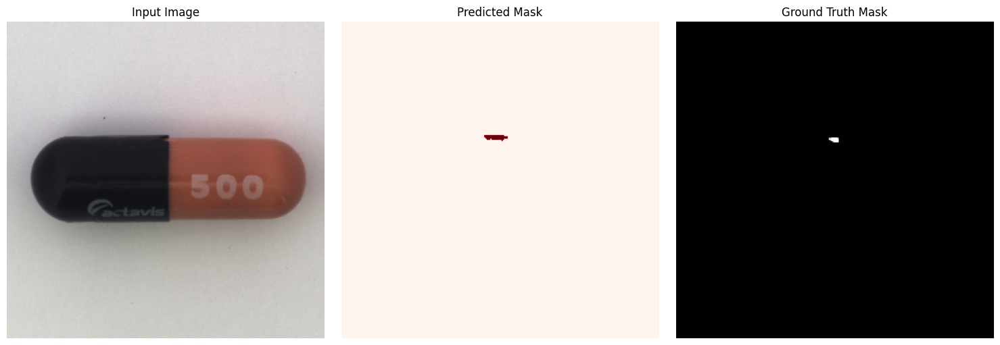

In [25]:
infer_and_plot(
    image_path="/kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_021.png",
    mask_path="/kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_021.bmp"
)


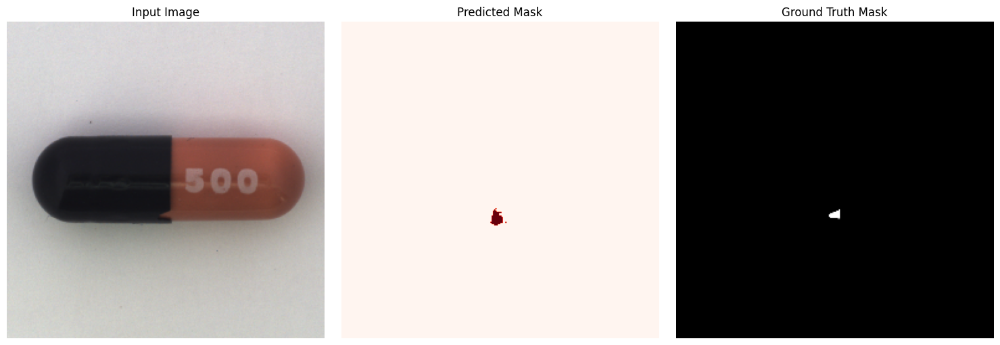

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_020.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_020.bmp


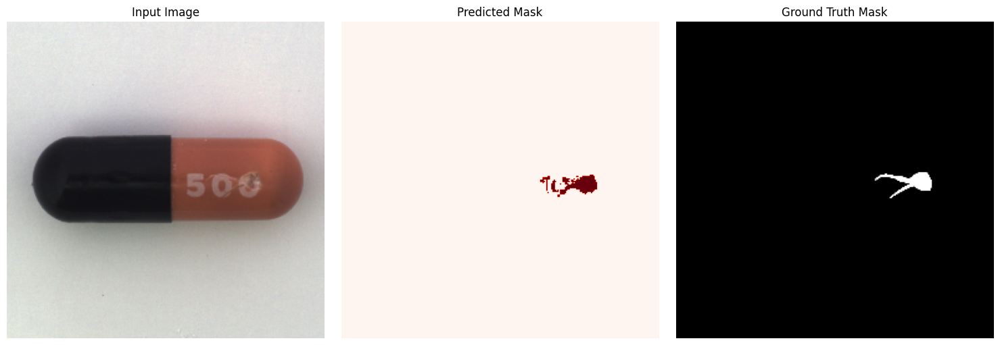

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_004.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_004.bmp


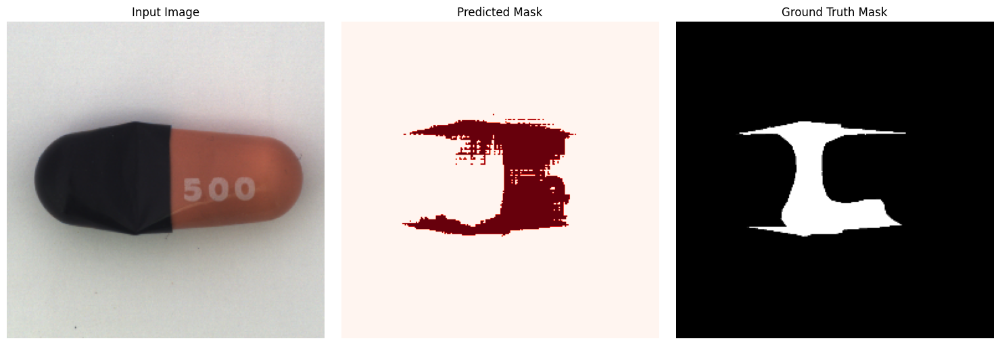

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_007.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_007.bmp


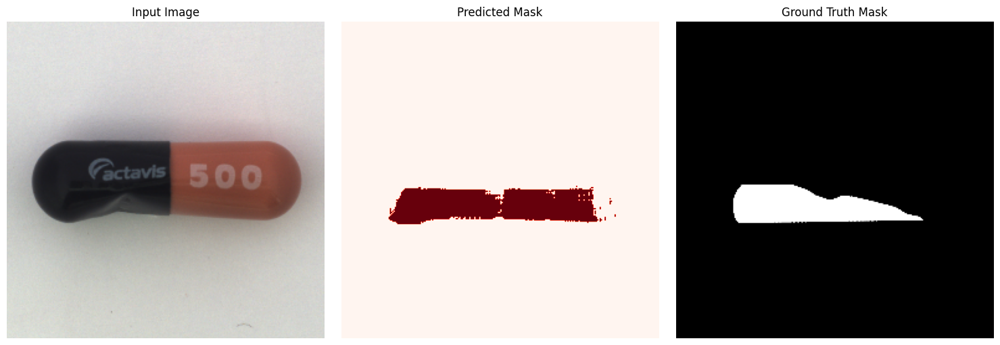

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_009.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_009.bmp


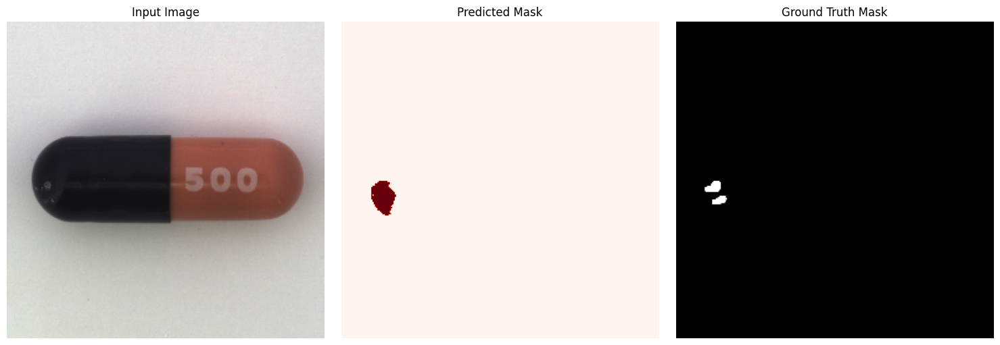

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_009.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_009.bmp


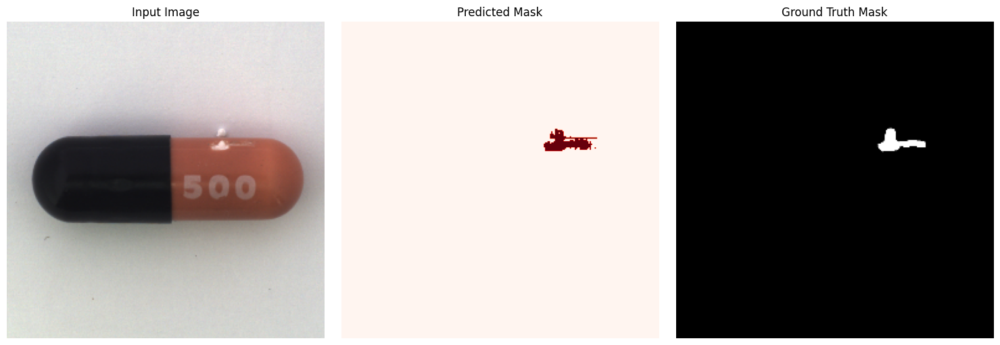

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_017.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_017.bmp


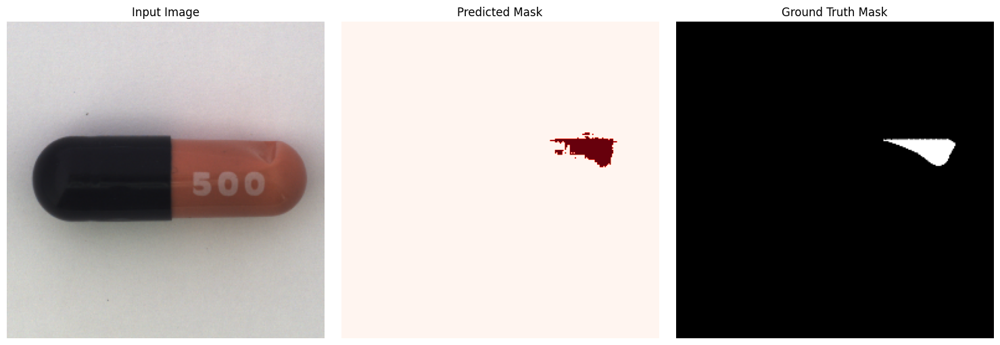

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_019.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_019.bmp


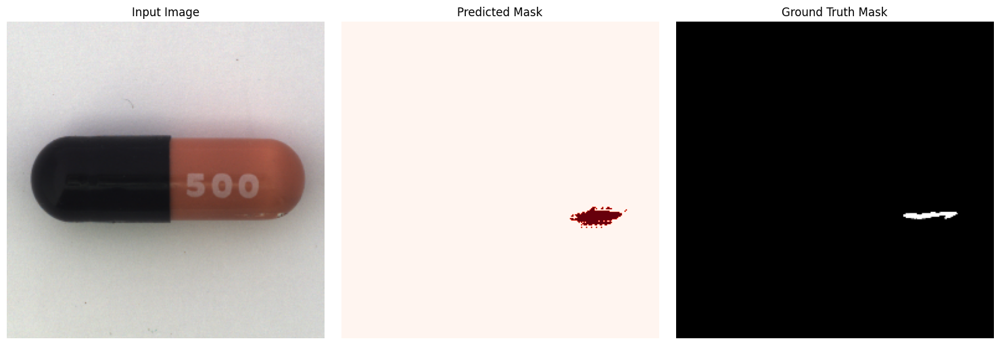

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_000.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_crack_000.bmp


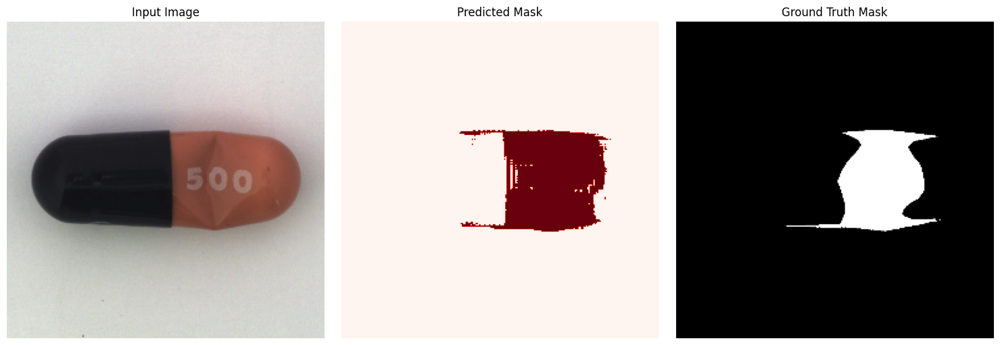

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_006.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_006.bmp


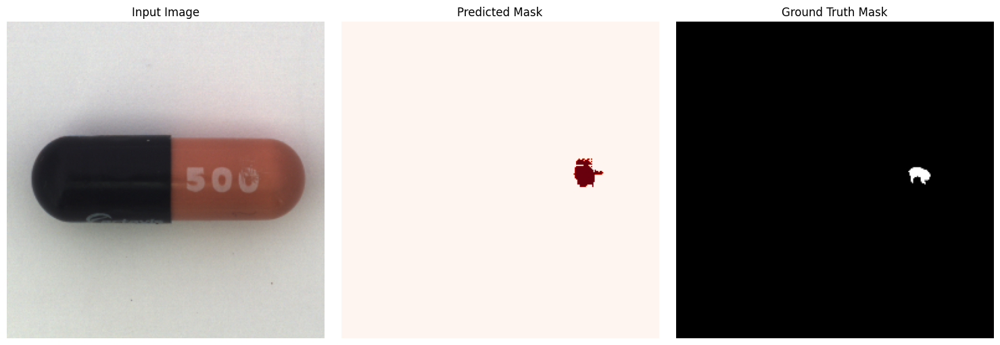

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_faulty_imprint_016.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_faulty_imprint_016.bmp


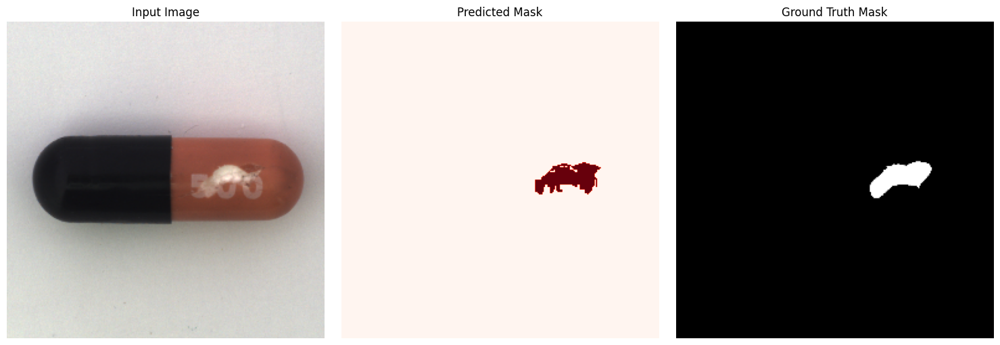

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_000.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_000.bmp


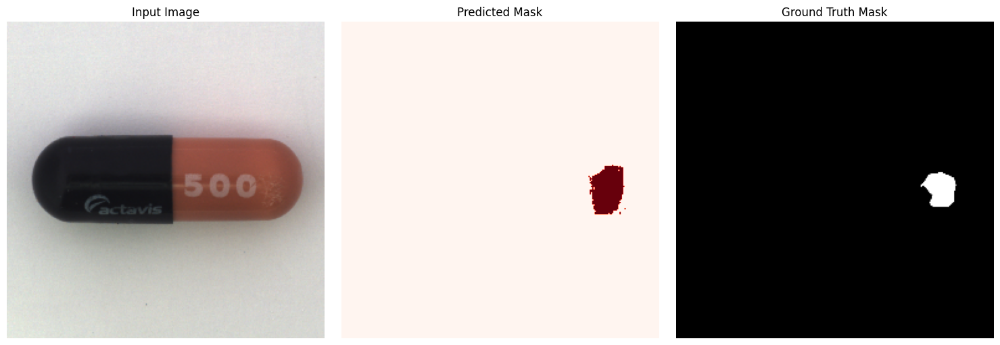

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_scratch_006.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_scratch_006.bmp


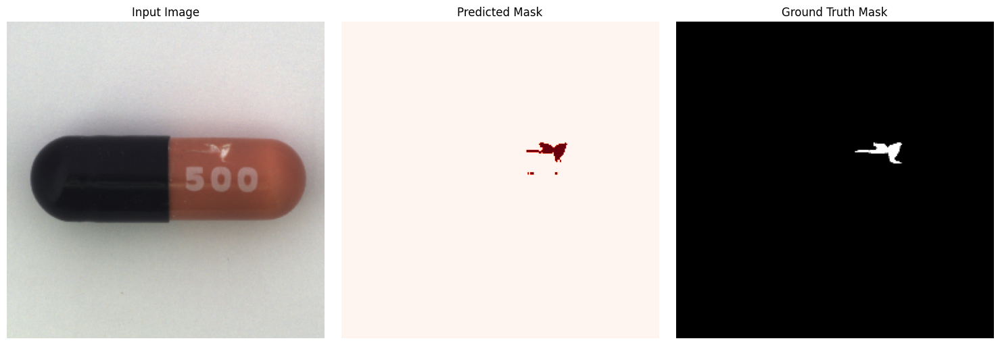

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_014.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_014.bmp


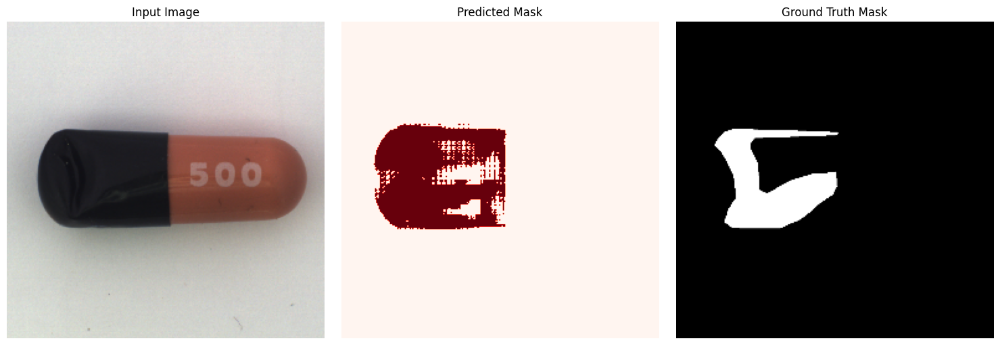

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_011.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_011.bmp


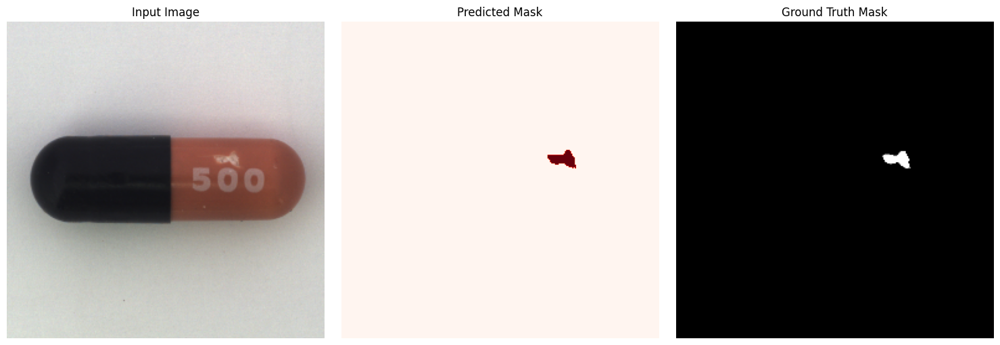

image path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_011.png
mask_path: /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_011.bmp


In [26]:
sample_paths = samples[:15]  # use first 5 test samples
for img_path, mask_path in sample_paths:
    infer_and_plot(img_path, mask_path)
    print(f'image path: {img_path}')
    print(f'mask_path: {mask_path}')

In [33]:
import matplotlib.pyplot as plt
import cv2
import numpy as np
import torch
from segment_anything import sam_model_registry
from segment_anything.utils.transforms import ResizeLongestSide

def get_bounding_box(mask, pad=10):
    y_indices, x_indices = np.where(mask > 0)
    if len(x_indices) == 0 or len(y_indices) == 0:
        return [0, 0, 1, 1]  # dummy box
    H, W = mask.shape
    x_min = max(0, np.min(x_indices) - np.random.randint(0, pad))
    x_max = min(W, np.max(x_indices) + np.random.randint(0, pad))
    y_min = max(0, np.min(y_indices) - np.random.randint(0, pad))
    y_max = min(H, np.max(y_indices) + np.random.randint(0, pad))
    return [x_min, y_min, x_max, y_max]

@torch.no_grad()
def compare_base_vs_finetuned(image_path, mask_path=None,
                              sam_type="vit_b",
                              sam_ckpt="/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth",
                              finetuned_decoder="/kaggle/working/sam_finetuned_box_only.pth"):
    
    resize = ResizeLongestSide(1024)

    # Load and resize input image
    image = cv2.imread(image_path)
    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    input_image = resize.apply_image(image_rgb)
    image_tensor = torch.as_tensor(input_image).permute(2, 0, 1).float().to("cuda") / 255.

    # Prepare bounding box prompt
    if mask_path:
        gt_mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
        gt_box = get_bounding_box(gt_mask)
        orig_h, orig_w = gt_mask.shape
        resized_h, resized_w = input_image.shape[:2]
        scale_x = resized_w / orig_w
        scale_y = resized_h / orig_h
        scaled_box = [
            gt_box[0] * scale_x,
            gt_box[1] * scale_y,
            gt_box[2] * scale_x,
            gt_box[3] * scale_y,
        ]
    else:
        h, w = input_image.shape[:2]
        scaled_box = [w // 4, h // 4, 3 * w // 4, 3 * h // 4]
        gt_mask = None

    box_tensor = torch.tensor([scaled_box], dtype=torch.float).to("cuda")

    # Load base model
    base_sam = sam_model_registry[sam_type](checkpoint=sam_ckpt).to("cuda")
    base_sam.eval()

    # Clone and load fine-tuned decoder into a second model
    tuned_sam = sam_model_registry[sam_type](checkpoint=sam_ckpt).to("cuda")
    tuned_sam.eval()
    tuned_sam.mask_decoder.load_state_dict(torch.load(finetuned_decoder))

    def run_model(sam_model):
        image_embedding = sam_model.image_encoder(image_tensor.unsqueeze(0))
        sparse_embeddings, dense_embeddings = sam_model.prompt_encoder(
            points=None,
            boxes=box_tensor,
            masks=None,
        )
        image_pe = sam_model.prompt_encoder.get_dense_pe().to("cuda")
        low_res_masks, _ = sam_model.mask_decoder(
            image_embeddings=image_embedding,
            image_pe=image_pe,
            sparse_prompt_embeddings=sparse_embeddings,
            dense_prompt_embeddings=dense_embeddings,
            multimask_output=False,
        )
        pred_mask = torch.nn.functional.interpolate(
            low_res_masks,
            size=image.shape[:2],
            mode="bilinear",
            align_corners=False,
        )
        pred_mask = (pred_mask.sigmoid() > 0.5).float().squeeze().cpu().numpy()
        return pred_mask

    pred_base = run_model(base_sam)
    pred_tuned = run_model(tuned_sam)

    # Plot comparison
    plt.figure(figsize=(16, 6))

    plt.subplot(1, 4, 1)
    plt.imshow(image_rgb)
    plt.title("Input Image")
    plt.axis("off")

    plt.subplot(1, 4, 2)
    plt.imshow(pred_base, cmap="Reds")
    plt.title("Base SAM Prediction")
    plt.axis("off")

    plt.subplot(1, 4, 3)
    plt.imshow(pred_tuned, cmap="Greens")
    plt.title("Fine-Tuned Prediction")
    plt.axis("off")

    if gt_mask is not None:
        plt.subplot(1, 4, 4)
        plt.imshow(gt_mask, cmap="gray")
        plt.title("Ground Truth")
        plt.axis("off")

    plt.tight_layout()
    plt.show()


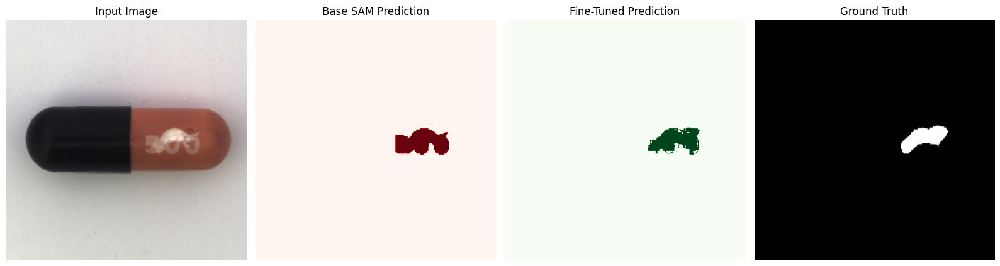

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_000.png


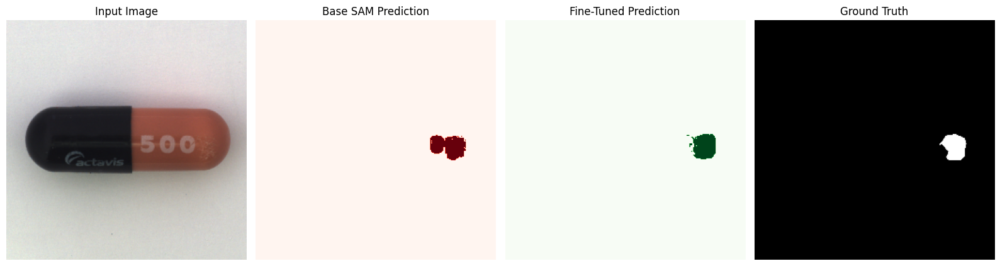

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_scratch_006.png


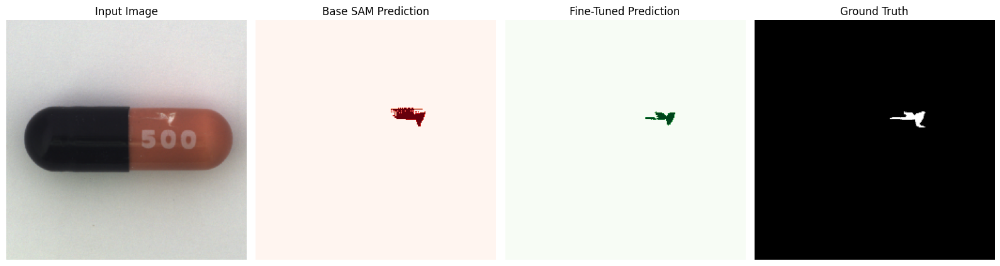

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_014.png


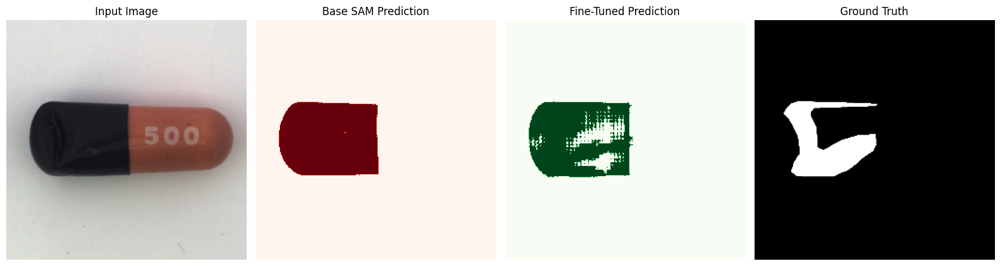

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_011.png


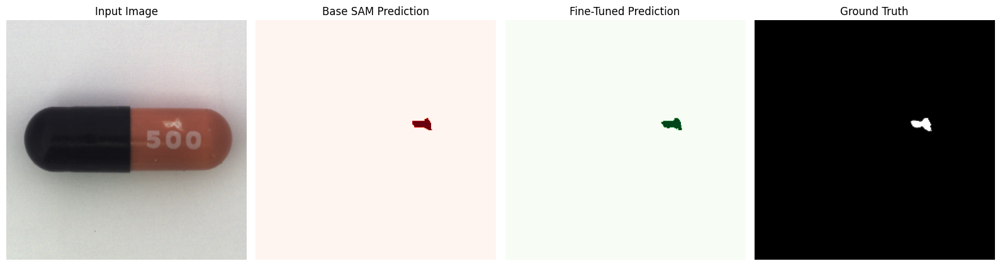

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_011.png


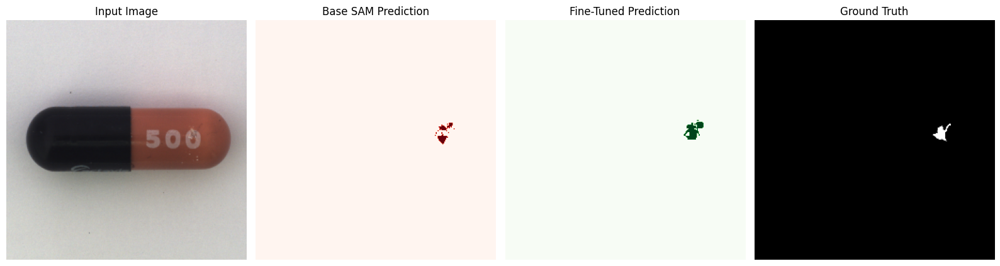

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_019.png


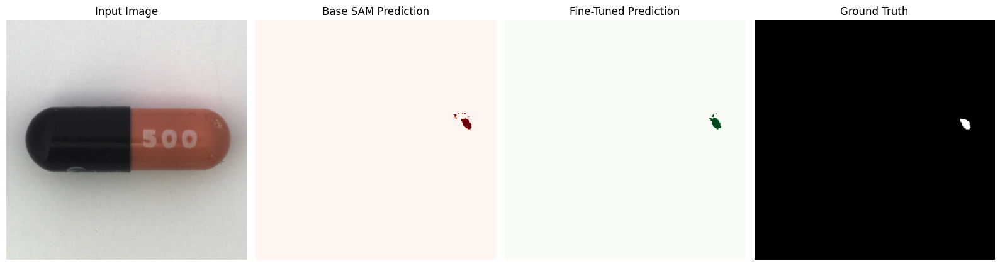

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_poke_017.png


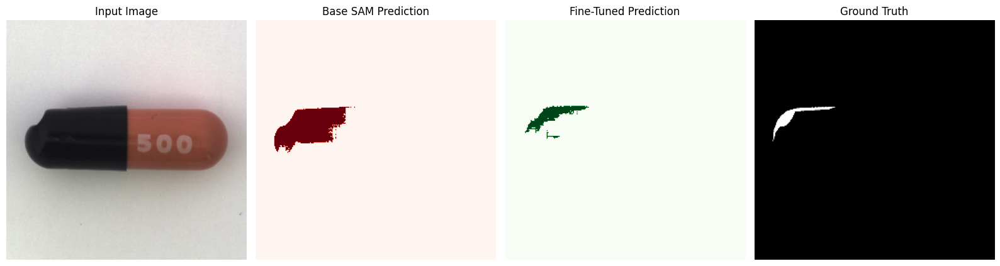

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_squeeze_017.png


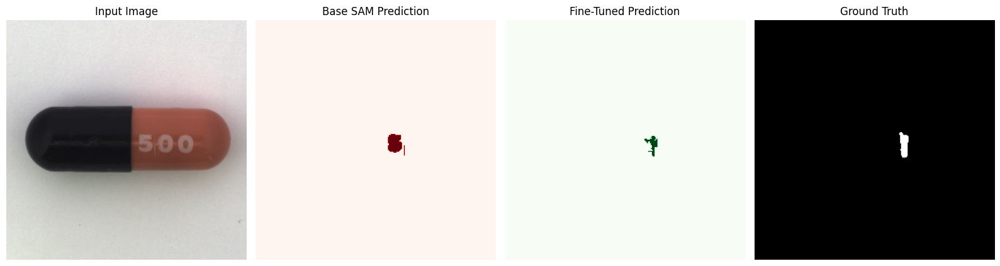

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_scratch_005.png


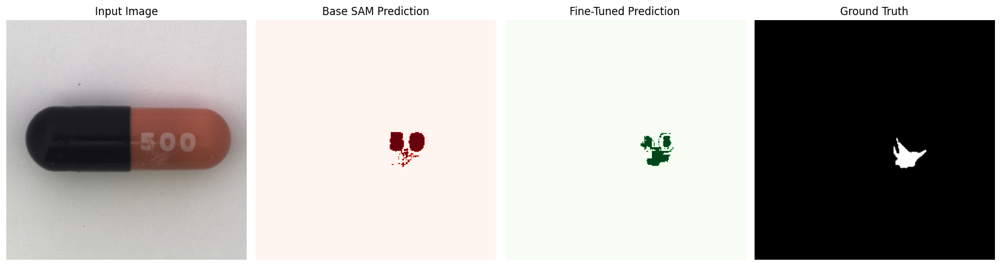

✅ /kaggle/input/few-shot-industrial-defect-detection/capsule/bad/test_scratch_010.png


In [36]:
for img_path, mask_path in samples[10:20]:
    compare_base_vs_finetuned(
        image_path=img_path,
        mask_path=mask_path,
        sam_type="vit_b",
        sam_ckpt="/kaggle/input/segment-anything/pytorch/vit-b/1/model.pth",
        finetuned_decoder="/kaggle/working/sam_finetuned_box_only.pth"
    )
    print("✅", img_path)
